# ELG7186 - Fall 2022 - Assignment 2
## Due: <strong>Wednesday November 2<sup>th</sup> 2022 -- 11:59pm</strong>

The purpose of this assignment is to gain experience building and training neural networks. You will learn:
- Design and train a fully-connected neural network
- Train an existing CNN architecture using fine-tuning
- Visualize the trained model


### Submission Details
Submit your Jupyter notebook .ipynb file using Brightspace. Do not include any other files or images as they will not be reviewed.
<p>
<strong>Make certain that you run all the cells in the notebook you submit</strong> or you will loose marks.
</p>
<ul>
<li>You can submit multiple times, but only the most recent submission will be saved</li>
<li>Do not wait until the last minute to submit in case you have an unexpected issue</li>
<li>Review the late policy in the syllabus</li>
<li><strong>You must submit your own work</strong> and abide by the University of Ottawa policy on plagiarism and fraud</li>
</ul>


### DO NOT submit any images from the dataset

## Part 0. Data Preparation

To complete the assignment you will download the Caltech Bird dataset and devise an appropriate training set split. <b>You are free to sample from the dataset to reduce the overal training samples depending on your access to compute.</b> Again, the overall accuracy is less important than your  observations and comparisons.

Dataset: <a href="http://www.vision.caltech.edu/visipedia/CUB-200-2011.html">Caltech-UCSD Birds-200-2011</a> (Also posed on Brightspace)

The dataset contains annotations for various tasks. In this assignment you will use the categories for classification (species labels)

In this section:
<ul>
<li>Download the dataset as described above</li>
<li>Create your splits for your dataset (there is a split provided for the full dataset) </li>
<li>Visualize five samples of each class by plotting a grid using the matplotlib library.</li>
</ul>


In [4]:
from google.colab import drive
drive.mount('/content/drive')
!tar xvzf /content/drive/MyDrive/CUB_200_2011.tgz

Streaming output truncated to the last 5000 lines.
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0050_111087.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0079_113288.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0004_111989.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0068_113247.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0127_111935.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0094_112773.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0028_113217.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0126_110959.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0007_111029.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0096_111519.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0120_113001.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0010_112678.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0025_111669.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0084_111300.j

In [ ]:
!tar xvzf /content/drive/MyDrive/CUB_200_2011.tgz# Check out the read me file to understand the data structure
!cat CUB_200_2011/README

In [7]:
!pip install livelossplot
# Import important libraries
import pandas as pd
import numpy as np
from pathlib import Path
import random
import cv2
import matplotlib.pyplot as plt
# Convert images to gray scale
from skimage import color
from skimage import io
import shutil
import os
# Split dataset
from sklearn.model_selection import train_test_split
# Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import os
from tensorflow.keras.models import Sequential
from keras.models import Model
import tensorflow as tf
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Dropout, Flatten
from pathlib import Path
import numpy as np
from livelossplot.inputs.keras import PlotLossesCallback
from sklearn.manifold import TSNE 
import seaborn as sns
from PIL import Image
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import load_img
from numpy import expand_dims

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 8.2 MB/s 


Now I will merge all the files in datafolder with their ids to make a dataframe that contains the imges and it labels 

In [ ]:
PATH = Path('./CUB_200_2011')
labels = pd.read_csv(PATH/"image_class_labels.txt", header=None, sep=" ")
labels.columns = ["id", "label"]
labels.head(2)

,id,label
0,1,1
1,2,1


In [ ]:
labels['label'].value_counts()

1      60
130    60
118    60
120    60
121    60
       ..
105    49
8      48
18     45
5      44
6      41
Name: label, Length: 200, dtype: int64

In [ ]:
labels.describe()

,id,label
count,11788.000000,11788.000000
mean,5894.500000,101.126315
std,3403.046821,57.476826
min,1.000000,1.000000
25%,2947.750000,51.000000
50%,5894.500000,101.000000
75%,8841.250000,151.000000
max,11788.000000,200.000000


In [ ]:
train_test = pd.read_csv(PATH/"train_test_split.txt", header=None, sep=" ")
train_test.columns = ["id", "is_train"]
train_test.head(2)

,id,is_train
0,1,0
1,2,1


In [ ]:
images = pd.read_csv(PATH/"images.txt", header=None, sep=" ")
images.columns = ["id", "name"]
images.head(2)

,id,name
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...


In [ ]:
images.iloc[0]

id                                                      1
name    001.Black_footed_Albatross/Black_Footed_Albatr...
Name: 0, dtype: object

In [ ]:
df0 = labels.join(train_test.set_index('id'), on='id')
df = df0.join(images.set_index('id'), on='id')
df

,id,label,is_train,name
0,1,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...
1,2,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
2,3,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...
3,4,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
4,5,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
...,...,...,...,...
11783,11784,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...
11784,11785,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...
11785,11786,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...
11786,11787,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...


### Visualization 5 samples of each class. 

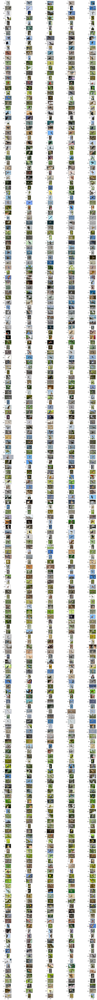

In [ ]:
fig = plt.figure(figsize=(20,200)) # specifying the overall grid size
row = 200
col = 5
k = 0
idx = 1

for i in range(0,200):
    k += 1
    img = df[df['label']==k].sample(n=5, random_state=1)['name']

    for j in img:
      fig.add_subplot(row, col, idx)
      plt.imshow(plt.imread(PATH/'images'/j))
      idx += 1

## Part 1. Perceptron (3 Marks)
For this section you will implement a fully connected neural network (multi-layer perceptron). To do this you will need to perform the following steps:
- Resize the images to be no larger than 32x32.
- Use the sequential model API in keras to build your network using dense layers (consider performance impacts of fully connected layers)
- You must decide an appropriate number of neurons and layers.
- Print a summary of your model configuration. 


When your classifier is working:
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data
- Provide a brief discussion of your results 


### Resize images (32,32)

In [ ]:
df

,id,label,is_train,name
0,1,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...
1,2,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
2,3,1,0,001.Black_footed_Albatross/Black_Footed_Albatr...
3,4,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
4,5,1,1,001.Black_footed_Albatross/Black_Footed_Albatr...
...,...,...,...,...
11783,11784,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...
11784,11785,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...
11785,11786,200,0,200.Common_Yellowthroat/Common_Yellowthroat_00...
11786,11787,200,1,200.Common_Yellowthroat/Common_Yellowthroat_00...


In [ ]:
# pip install Pillow==9.0.0
# pip install --ignore-installed Pillow==9.0.0

In [ ]:
# Here I made a new path to save the new sized data in it.
# path to source directory
src_dir = PATH/'images'
 
# path to destination directory
dest_dir = PATH/'new_sized_images'
 
# getting all the files in the source directory
files = os.listdir(src_dir)
 
shutil.copytree(src_dir, dest_dir)

WindowsPath('CUB_200_2011/new_sized_images')

### Convert images to grayScale

In [ ]:
imgs = df['name']

for i in range(len(imgs)):
  read_image = io.imread(PATH/'new_sized_images'/imgs.iloc[i])
  img = color.rgb2gray(read_image)
  io.imsave(PATH/'new_sized_images'/df['name'][i],img)

### Reshape images

In [ ]:
basewidth = 32
basehight = 32

In [ ]:
imgs = df['name']

for i in range(len(imgs)):
  img = Image.open(PATH/'new_sized_images'/df['name'].iloc[i])
  img = img.resize((basewidth,basehight))
  img.save(PATH/'new_sized_images'/df['name'].iloc[i])

### Split dataset

In [ ]:
y = df['label']
X = df.loc[:, df.columns != 'label']

In [ ]:
X_train_df, X_test_df, y_train, y_test = train_test_split(X, y,
                                                    stratify=y, 
                                                    test_size=0.25)

In [ ]:
X_train_df.shape, X_test_df.shape

((8841, 3), (2947, 3))

In [ ]:
X_train = []

imgs = X_train_df['name']

for j in imgs:
  img = plt.imread(PATH/'new_sized_images'/j)
  X_train.append(img)
  

In [ ]:
X_test = []

imgs = X_test_df['name']
for j in imgs:
  img = plt.imread(PATH/'new_sized_images'/j)
  X_test.append(img)

In [ ]:
# Test data with real size, will use it in in TSNE part

X_test2 = []

imgs2 = X_test_df['name']

for j in imgs2:
  img = plt.imread(PATH/'images'/j)
  X_test2.append(img)


In [ ]:
len(X_test)

2947

In [ ]:
len(X_train)

8841

In [ ]:
# shapes = list(map(lambda pic: pic.shape, X_train))
# np.unique(shapes)

In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)

In [ ]:
X_train.shape

(8841, 32, 32)

In [ ]:
X_test.shape

(2947, 32, 32)

### Sequential model API in keras to 

Create a sequetial model with 32, 32 input shape

In [ ]:
# get input dimension 28x28 pixels
input_dim = (32,32)
# get output dimensions 10 classes
output_dim = len(np.unique(y_train))+1

# create sequential model
model = keras.Sequential()
model.add(layers.Flatten())
model.add(layers.Dense(units=800, activation='relu',input_shape=input_dim))
model.add(layers.BatchNormalization())
model.add(layers.Dense(units=600, activation='relu'))
model.add(layers.Dropout(.17))
model.add(layers.BatchNormalization())
model.add(layers.Dense(units=600, activation='relu'))
model.add(layers.Dropout(.17))
model.add(layers.Dense(units=600, activation='relu'))
model.add(layers.Dense(units=output_dim, activation='softmax'))

In [ ]:
# compile the model
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [ ]:
# train the model
model.fit(
    X_train, y_train,
    epochs=40,
    batch_size=50,
    validation_data=(X_test, y_test)
)


Epoch 1/40
177/177 [==============================] - 7s 34ms/step - loss: 5.3519 - acc: 0.0083 - val_loss: 5.2911 - val_acc: 0.0115
Epoch 2/40
177/177 [==============================] - 6s 34ms/step - loss: 5.1877 - acc: 0.0126 - val_loss: 5.2287 - val_acc: 0.0132
Epoch 3/40
177/177 [==============================] - 6s 34ms/step - loss: 5.1151 - acc: 0.0178 - val_loss: 5.2973 - val_acc: 0.0102
Epoch 4/40
177/177 [==============================] - 6s 35ms/step - loss: 5.0534 - acc: 0.0214 - val_loss: 5.4578 - val_acc: 0.0061
Epoch 5/40
177/177 [==============================] - 7s 37ms/step - loss: 4.9925 - acc: 0.0233 - val_loss: 5.6127 - val_acc: 0.0109
Epoch 6/40
177/177 [==============================] - 6s 33ms/step - loss: 4.9385 - acc: 0.0285 - val_loss: 6.1859 - val_acc: 0.0061
Epoch 7/40
177/177 [==============================] - 6s 34ms/step - loss: 4.8798 - acc: 0.0336 - val_loss: 5.4149 - val_acc: 0.0102
Epoch 8/40
177/177 [==============================] - 6s 34ms/step - 

### Model summary

In [ ]:
# get model summary
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_6 (Flatten)         (None, 1024)              0         
                                                                 
 dense_30 (Dense)            (None, 800)               820000    
                                                                 
 batch_normalization_12 (Bat  (None, 800)              3200      
 chNormalization)                                                
                                                                 
 dense_31 (Dense)            (None, 600)               480600    
                                                                 
 dropout_4 (Dropout)         (None, 600)               0         
                                                                 
 batch_normalization_13 (Bat  (None, 600)              2400      
 chNormalization)                                     

### Loss curve for training and test data
   


In [ ]:
train_loss = model.history.history['loss']

In [ ]:
test_loss = model.history.history['val_acc']

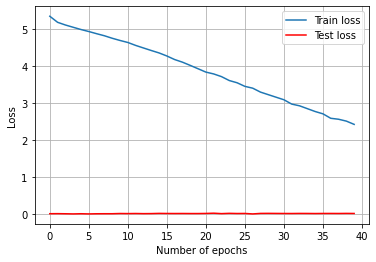

In [ ]:
plt.plot(train_loss)
plt.plot(test_loss,'r')
plt.legend(['Train loss', 'Test loss']) 
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.grid()

### Accuracy curve for training and test data


In [ ]:
train_acc = model.history.history['acc']
test_acc = model.history.history['val_acc']

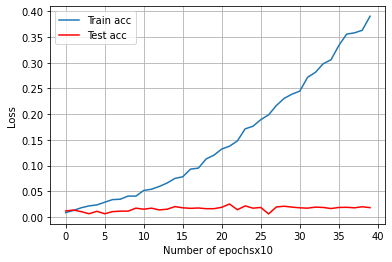

In [ ]:
plt.plot(train_acc)
plt.plot(test_acc,'r')
plt.legend(['Train acc', 'Test acc']) 
plt.xlabel("Number of epochsx10")
plt.ylabel("Loss")
plt.grid()

### Results discussion


The loss is two high, this may be because the size of the image is not sutable for the problem or the model couldn't learn the features in the images.


The difference between the training and testing accuracy can tell that the model is overfitting, and even when using droupout and batch normalization, the overfitting didn't reduce.

## Part 2. ResNet-101 (4 Marks)

For this section you will adapt the ResNet-101 network for the current task using tranfer learning and fine-tuning. You will implement the following in your process:
- You should choose a suitable image size.
- Choose a suitable labelling scheme.
- Use the pretrained ResNet-101 network available in Keras.
- Remove the top fully connected layers. Include your own FC layers that match our dataset.
- Choose some layers to "freeze" and the remaining layers you will fine-tune with the new dataset.





### Step 1
You will use the above steps to train a ResNet-101 model using the Bird dataset
- Use transfer learning to train your first model by removing the FC layers, but leaving the other layers intact.
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data


In [10]:
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [11]:
 !pip install livelossplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [12]:
plot_loss_1 = PlotLossesCallback()

# ModelCheckpoint callback - save best weights
tl_checkpoint_1 = ModelCheckpoint(filepath='tl_model_v1.weights.best.hdf5',
                                  save_best_only=True,
                                  verbose=1)

# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',
                           patience=10,
                           restore_best_weights=True,
                           mode='min')


In [13]:
data_dir = "./CUB_200_2011/images"

In [ ]:
img_height,img_width=224,224
batch_size=64

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 11788 files belonging to 200 classes.
Using 9431 files for training.


In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 11788 files belonging to 200 classes.
Using 2357 files for validation.


In [15]:
def create_model(input_shape, n_classes, fine_tune=0):
  resnet_model = Sequential()

  pretrained_model= tf.keras.applications.ResNet101(include_top=False,
                    input_shape=input_shape,
                    pooling='avg',classes=200,
                    weights='imagenet')

  # Fine-tune from this layer onwards

  # Freeze all the layers before the `fine_tune_at` layer
  # Defines how many layers to freeze during training.
  # Layers in the convolutional base are switched from trainable to non-trainable
  # depending on the size of the fine-tuning parameter.
  for layer in pretrained_model.layers[:fine_tune]:
    layer.trainable = False
    
  resnet_model.add(pretrained_model)

  resnet_model.add(Flatten())
  resnet_model.add(Dense(800, activation='relu'))
  resnet_model.add(Dense(600, activation='elu'))
  resnet_model.add(Dense(200, activation='softmax'))



    
  return resnet_model

In [ ]:
fine_tune = 0
input_shape = (224,224,3)
n_classes = 200

resnet1 = create_model(input_shape, n_classes, fine_tune)

171446536/171446536 [==============================] - 8s 0us/step


In [ ]:
resnet1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 2048)              42658176  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 800)               1639200   
                                                                 
 dense_1 (Dense)             (None, 600)               480600    
                                                                 
 dense_2 (Dense)             (None, 200)               120200    
                                                                 
Total params: 44,898,176
Trainable params: 2,240,000
Non-trainable params: 42,658,176
_________________________________________________________________


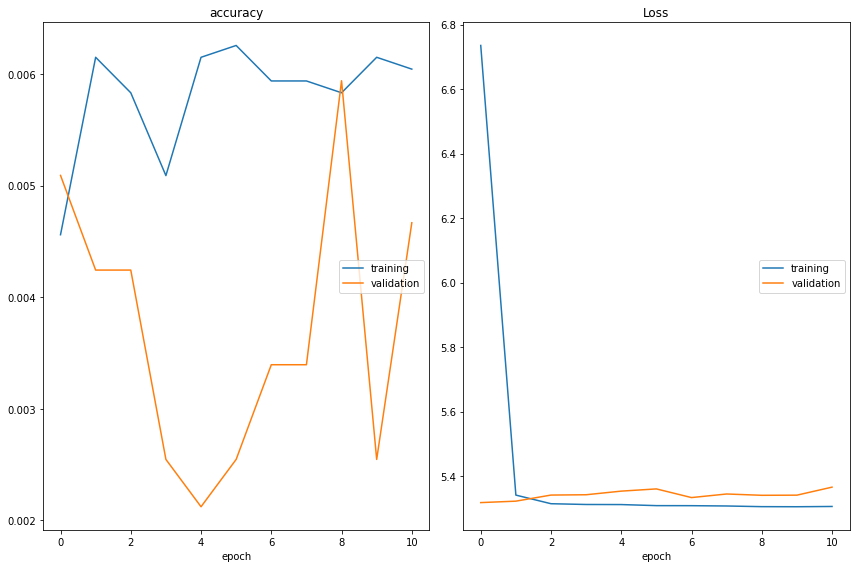

accuracy
	training         	 (min:    0.005, max:    0.006, cur:    0.006)
	validation       	 (min:    0.002, max:    0.006, cur:    0.005)
Loss
	training         	 (min:    5.305, max:    6.735, cur:    5.305)
	validation       	 (min:    5.317, max:    5.365, cur:    5.365)
148/148 [==============================] - 3490s 24s/step - loss: 5.3055 - accuracy: 0.0060 - val_loss: 5.3654 - val_accuracy: 0.0047


In [ ]:
resnet1.compile(optimizer=Adam(lr=0.01),loss='sparse_categorical_crossentropy',metrics=['accuracy'])


history = resnet1.fit(train_ds, 
                           validation_data=val_ds,
                           epochs=40,
                           batch_size=64,
                           callbacks=[tl_checkpoint_1, early_stop, plot_loss_1],)

### Step 2
Now use the same steps as above, but this time unfreeze some convolutional layers and retrain the network. Again, plot your results.


In [14]:
img_height,img_width=64,64
batch_size=64

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)


val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 11788 files belonging to 200 classes.
Using 9431 files for training.
Found 11788 files belonging to 200 classes.
Using 2357 files for validation.


In [19]:
fine_tune = 10
input_shape = (64,64,3)
resnet2 = create_model(input_shape, n_classes, fine_tune)

171446536/171446536 [==============================] - 22s 0us/step


In [20]:
resnet2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 2048)              42658176  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 800)               1639200   
                                                                 
 dense_1 (Dense)             (None, 600)               480600    
                                                                 
 dense_2 (Dense)             (None, 200)               120200    
                                                                 
Total params: 44,898,176
Trainable params: 44,778,944
Non-trainable params: 119,232
_________________________________________________________________


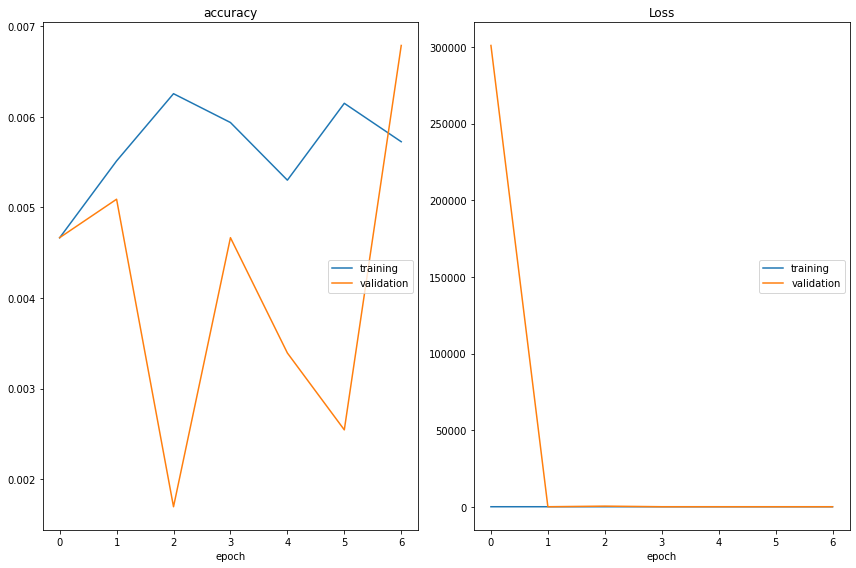

accuracy
	training         	 (min:    0.005, max:    0.006, cur:    0.006)
	validation       	 (min:    0.002, max:    0.007, cur:    0.007)
Loss
	training         	 (min:    5.317, max:    5.499, cur:    5.326)
	validation       	 (min:    5.348, max: 301024.375, cur:    5.354)
148/148 [==============================] - 1469s 10s/step - loss: 5.3257 - accuracy: 0.0057 - val_loss: 5.3544 - val_accuracy: 0.0068
Epoch 8/40
 59/148 [==========>...................] - ETA: 14:14 - loss: 5.3216 - accuracy: 0.0061

In [ ]:
resnet2.compile(optimizer=Adam(lr=0.01),loss='sparse_categorical_crossentropy',metrics=['accuracy'])


history = resnet2.fit(train_ds, 
                           validation_data=val_ds,
                           epochs=40,
                           batch_size=64,
                           callbacks=[tl_checkpoint_1, early_stop, plot_loss_1],)


### Step 3
Discuss the results of both methods from step 1 and step 2 while using plots and graphics to support your discussion.

#Write your ResNet-101 code here
I built a function with ResNest-101 model with flatten and 3 Dense layers that takes input shape which has Total params: 44,898,176, 
Trainable params: 2,240,000, Non-trainable params: 42,658,176 
.<br>and its output is loss: 5.3055 - accuracy: 0.0060 - val_loss: 5.3654 - val_accuracy: 0.0047.<br>
Then I build another ResNet-101 model but I unfreeze some convolutional layers and consider the fine-tune parameter = 10 and retrain the network. .<br>
and has Total params: 44,898,176
Trainable params: 44,778,944
Non-trainable params: 119,232.<br>
and has loss: 5.3257 - accuracy: 0.0057 - val_loss: 5.3544 - val_accuracy: 0.0068
which is alittle better than the last one. in this part i reduced the imageds shape to 64 to reduce the training time.

Write your discussion here.

## Part 3. Visualization (3 Marks)

For this section you will visualize the filters learned by your ResNet-101 network and use t-SNE to observe clusters that were learned by your model.
- Make sure to provide the graphic results for your visualizations
- Provide an interpretation of the results


### Visualize the filters learned by ResNet-101 network


The model provides access to all of the model's layers. characteristic of layers.

Convolutional layers use naming conventions like block# conv#, where the '#' is an integer, and each layer has a layer.name property. As a result, we may examine each layer's name and disregard any that do not contain the word "conv."

In [ ]:

# summarize filter shapes
for layer in resnet2.layers:
	# check for convolutional layer
	if 'conv' not in layer.name:
		continue

In [ ]:

# get filter weights
filters, biases = layer.get_weights()
print(layer.name, filters.shape)

dense_11 (600, 200)


In [ ]:
# retrieve weights from the second hidden layer
filters, biases = resnet2.layers[0].layers[2].get_weights()

In [ ]:

# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

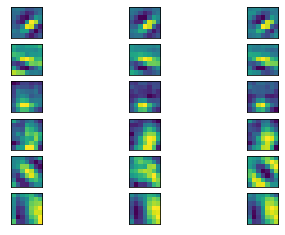

In [ ]:
# plot first few filters
n_filters, ix = 6, 1
for i in range(n_filters):
	# get the filter
	f = filters[:, :, :, i]
	# plot each channel separately
	for j in range(3):
		# specify subplot and turn of axis
		ax = pyplot.subplot(n_filters, 3, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		pyplot.imshow(f[:, :, j])
		ix += 1
# show the figure
pyplot.show()

In [ ]:
resnet2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 2048)              42658176  
                                                                 
 flatten_3 (Flatten)         (None, 2048)              0         
                                                                 
 dense_9 (Dense)             (None, 800)               1639200   
                                                                 
 dense_10 (Dense)            (None, 600)               480600    
                                                                 
 dense_11 (Dense)            (None, 200)               120200    
                                                                 
Total params: 44,898,176
Trainable params: 2,240,000
Non-trainable params: 42,658,176
_________________________________________________________________


In [ ]:
precited_Y=resnet2.predict(val_ds).argmax(axis=1)	

Faltten_Model =tf.keras.Model(inputs=resnet2.input, outputs= resnet2.get_layer("flatten_3").output )

flatten_Featuers = Faltten_Model.predict(val_ds)


37/37 [==============================] - 82s 2s/step


In [ ]:

tsne = TSNE(n_components=2).fit_transform(flatten_Featuers)

# scale and move the coordinates so they fit [0; 1] range
def scale_to_01_range(x):
    # compute the distribution range
    value_range = (np.max(x) - np.min(x))
 
    # move the distribution so that it starts from zero
    # by extracting the minimal value from all its values
    starts_from_zero = x - np.min(x)
 
    # make the distribution fit [0; 1] by dividing by its range
    return starts_from_zero / value_range
 
# extract x and y coordinates representing the positions of the images on T-SNE plot
tx = tsne[:, 0]
ty = tsne[:, 1]
 
tx = scale_to_01_range(tx)
ty = scale_to_01_range(ty)

c:\Users\Gehad\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Users\Gehad\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


<AxesSubplot:>

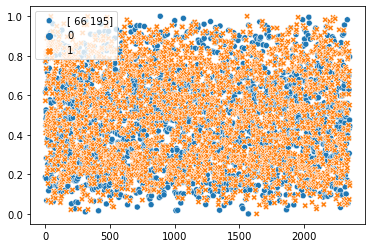

In [ ]:

sns.scatterplot(data=[tx, ty],label=np.unique(precited_Y))

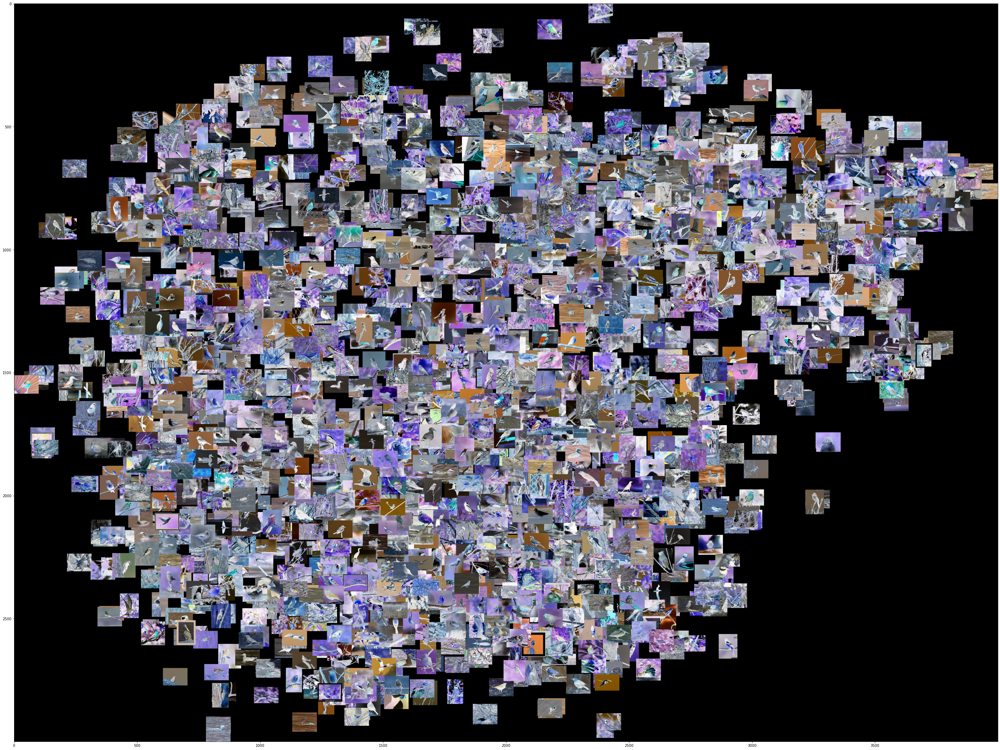

In [ ]:


width = 4000
height = 3000
max_dim = 100

full_image = Image.new('RGB', (width, height))

for x, xi, y in zip( X_test2, tx, ty):  


    tile = Image.fromarray(np.uint8(x * 255))
    rs = max(1, tile.width / max_dim, tile.height / max_dim)
    tile = tile.resize((int(tile.width / rs),
                        int(tile.height / rs)),
                       Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim) * xi),
                            int((height-max_dim) * y)))
plt.figure(figsize=(50,50))
plt.imshow(full_image)

The Tsne plot didn't configure more than 2 classes of 200 classes, which enchance the idea that the images shape selected are not the best choice or the layers of the model should be tuned more.